In [1]:
import os
from src.utils import *

import warnings
warnings.filterwarnings("ignore")

from IPython.display import Image, display

In [2]:
# Set up output directory
output_dir = "results"
os.makedirs(output_dir, exist_ok=True)

In [3]:
# Paths to data
chia_pet_file = "data/4DNFIS9CCN6R_CHIAPET_LOOPS.bedpe/4DNFIS9CCN6R_CHIAPET_LOOPS.bedpe"
ctcf_chip_file = "data/ENCFF356LIU_CTCF_CHIPSEQ.bed/ENCFF356LIU_CTCF_CHIPSEQ.bed"
rad21_chip_file = "data/ENCFF834GOT_RAD21_CHIPSEQ.bed/ENCFF834GOT_RAD21_CHIPSEQ.bed"

In [4]:
# Step 1: Load the data
print("Step 1: Loading datasets...")
chia_pet = load_bedpe(chia_pet_file)
print("Chia-PET Loaded")
ctcf_chip = load_bed(ctcf_chip_file)
print("CTCF Loaded")
rad21_chip = load_bed(rad21_chip_file)
print("Rad21 Loaded")

Step 1: Loading datasets...
Chia-PET Loaded
CTCF Loaded
Rad21 Loaded


In [5]:
# Show basic info about datasets
print(f"Loaded {len(chia_pet)} chromatin loops")
print(f"Loaded {len(ctcf_chip)} CTCF ChIP-seq peaks")
print(f"Loaded {len(rad21_chip)} Rad21 ChIP-seq peaks")


Loaded 5815083 chromatin loops
Loaded 40949 CTCF ChIP-seq peaks
Loaded 34623 Rad21 ChIP-seq peaks


In [6]:
# Examine first few rows of each dataset
print("\nChIA-PET loops (first 3 rows):")
display(chia_pet.head(3))

print("\nCTCF ChIP-seq peaks (first 3 rows):")
display(ctcf_chip.head(3))

print("\nRad21 ChIP-seq peaks (first 3 rows):")
display(rad21_chip.head(3))



ChIA-PET loops (first 3 rows):


,chrom1,start1,end1,chrom2,start2,end2,loop_id,loop_length
0,chr10,49043,49694,chr10,1596907,1597444,loop_0,1547213
1,chr10,49291,49814,chr10,71061105,71061664,loop_1,71011291
2,chr10,50096,50747,chr10,19437275,19437902,loop_2,19386528



CTCF ChIP-seq peaks (first 3 rows):


,chrom,start,end
0,chr3,39812740,39813090
1,chr2,96508234,96508584
2,chr20,577635,577985



Rad21 ChIP-seq peaks (first 3 rows):


,chrom,start,end
0,chrX,10119439,10119802
1,chr4,147866870,147867089
2,chr20,34312736,34312962


In [7]:
# Step 2: Filter loops with CTCF ChIP-seq peaks
print("\nStep 2: Filtering loops with CTCF peaks...")
chia_pet, ctcf_one_anchor, ctcf_both_anchors = filter_loops(chia_pet, ctcf_chip, "CTCF")
print(f"Found {len(ctcf_one_anchor)} loops with CTCF in at least one anchor")
print(f"Found {len(ctcf_both_anchors)} loops with CTCF in both anchors")



Step 2: Filtering loops with CTCF peaks...


Found 1230768 loops with CTCF in at least one anchor
Found 49905 loops with CTCF in both anchors


In [8]:
# Step 3: Filter loops with Rad21 ChIP-seq peaks
print("\nStep 3: Filtering loops with Rad21 peaks...")
chia_pet, rad21_one_anchor, rad21_both_anchors = filter_loops(chia_pet, rad21_chip, "Rad21")
print(f"Found {len(rad21_one_anchor)} loops with Rad21 in at least one anchor")
print(f"Found {len(rad21_both_anchors)} loops with Rad21 in both anchors")



Step 3: Filtering loops with Rad21 peaks...
Found 1070890 loops with Rad21 in at least one anchor
Found 37902 loops with Rad21 in both anchors


In [9]:
# Step 4: Find common loops between datasets
print("\nStep 4: Finding common loops between datasets...")
# Loops with both CTCF and Rad21 in at least one anchor
common_one_anchor = chia_pet[
    (chia_pet["CTCF_one_anchor"]) & 
    (chia_pet["Rad21_one_anchor"])
]

# Loops with both CTCF and Rad21 in both anchors
common_both_anchors = chia_pet[
    (chia_pet["CTCF_both_anchors"]) & 
    (chia_pet["Rad21_both_anchors"])
]

print(f"Found {len(common_one_anchor)} loops with both CTCF and Rad21 in at least one anchor")
print(f"Found {len(common_both_anchors)} loops with both CTCF and Rad21 in both anchors")



Step 4: Finding common loops between datasets...
Found 966214 loops with both CTCF and Rad21 in at least one anchor
Found 29179 loops with both CTCF and Rad21 in both anchors


In [10]:
# Step 5: Generate statistics and save to files
print("\nStep 5: Generating statistics...")
stats = analyze_loop_overlaps(chia_pet, output_dir)
display(stats)



Step 5: Generating statistics...


,Metric,Count,Percentage
0,Total loops,5815083,100.000000
1,Loops with CTCF in at least one anchor,1230768,21.165098
2,Loops with CTCF in both anchors,49905,0.858199
3,Loops with Rad21 in at least one anchor,1070890,18.415730
4,Loops with Rad21 in both anchors,37902,0.651788
5,Loops with both CTCF and Rad21 in at least one...,966214,16.615653
6,Loops with both CTCF and Rad21 in both anchors,29179,0.501781
7,Loops with CTCF in anchor 1,639459,10.996558
8,Loops with CTCF in anchor 2,641214,11.026739
9,Loops with Rad21 in anchor 1,553802,9.523544


In [11]:
# Step 6: Create visualizations
print("\nStep 6: Creating statistical visualizations...")
visualize_loop_statistics(chia_pet, output_dir)
print(f"Saved statistical visualizations to {output_dir}")



Step 6: Creating statistical visualizations...
Saved statistical visualizations to results


<Figure size 1200x600 with 0 Axes>

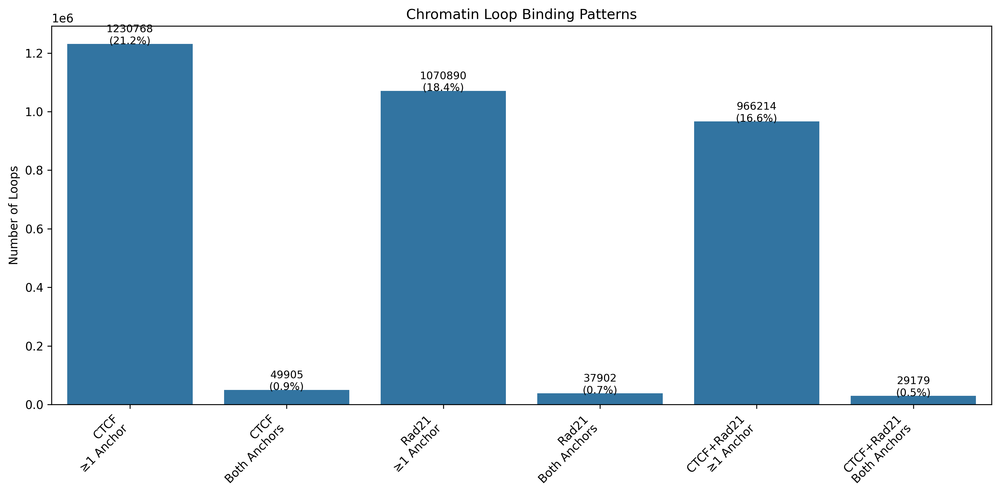

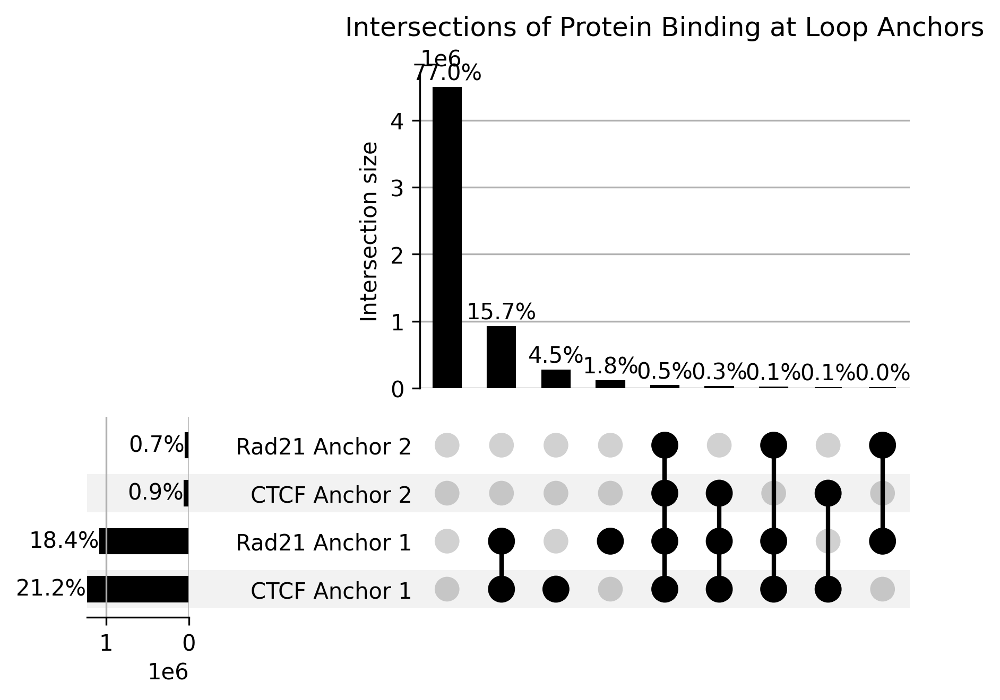

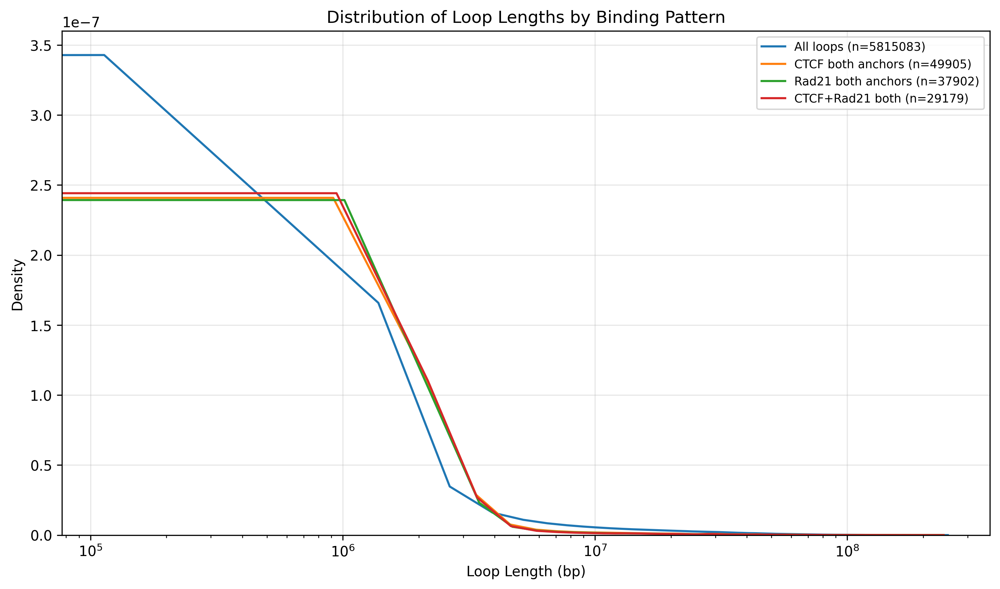

In [12]:
display(Image(f"{output_dir}/loop_count_comparison.png"))
display(Image(f"{output_dir}/upset_plot.png"))
display(Image(f"{output_dir}/loop_length_distribution.png"))


Step 7: Visualizing example genomic regions...
Visualizing region with co-binding: chr12:115883381-117017683
Visualizing 1539 loops in chr12:115883381-117017683


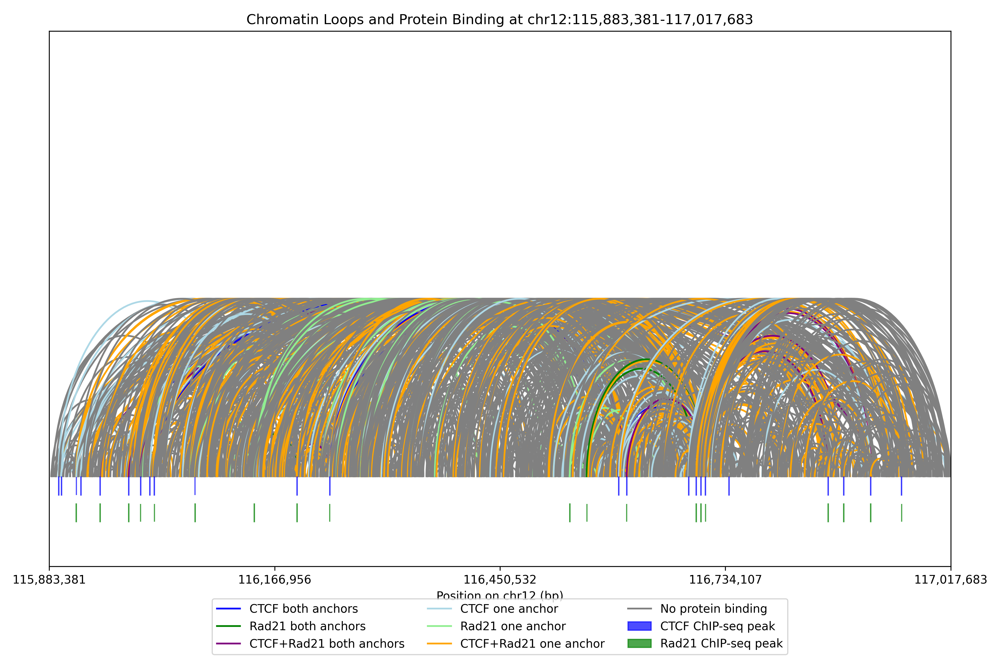

Visualizing region with co-binding: chr19:10080246-10580246
Visualizing 1528 loops in chr19:10080246-10580246


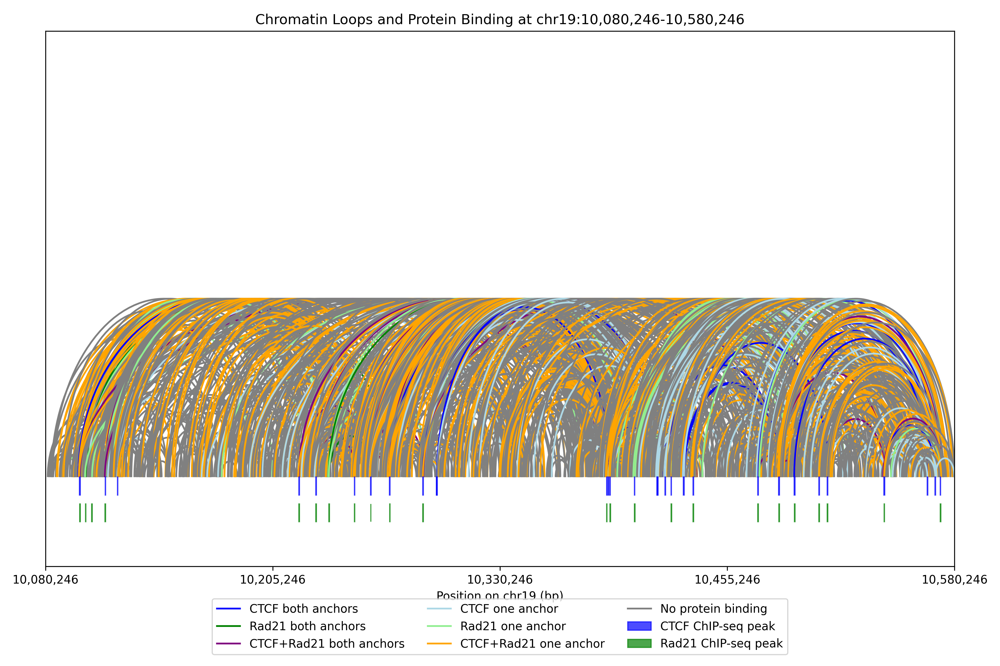

Visualizing region with co-binding: chr12:25021298-25521298
Visualizing 593 loops in chr12:25021298-25521298


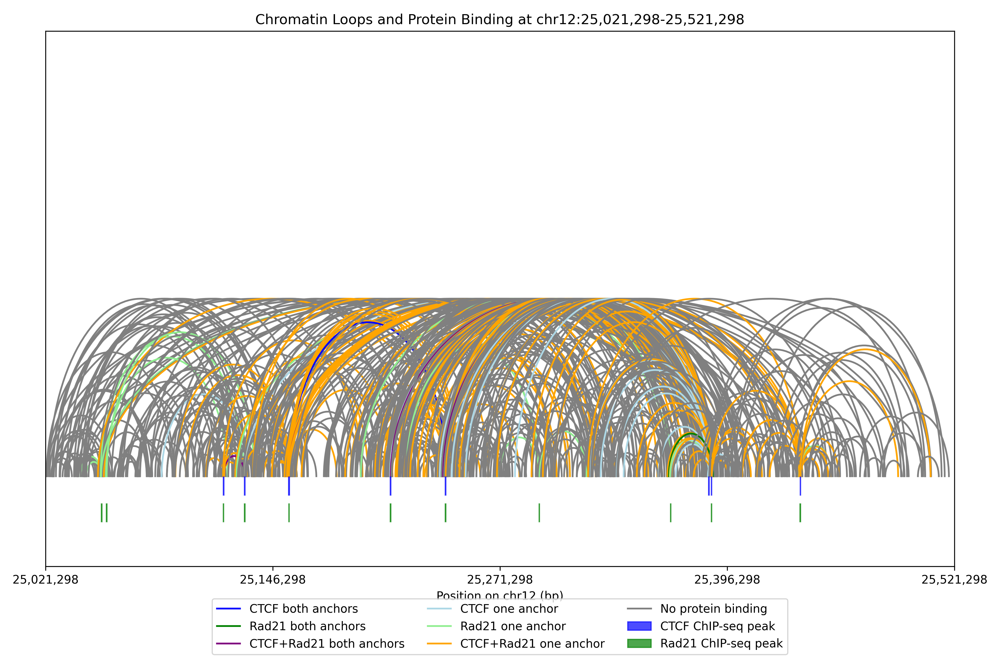

Visualizing region with co-binding: chr12:127122654-127622654
Visualizing 310 loops in chr12:127122654-127622654


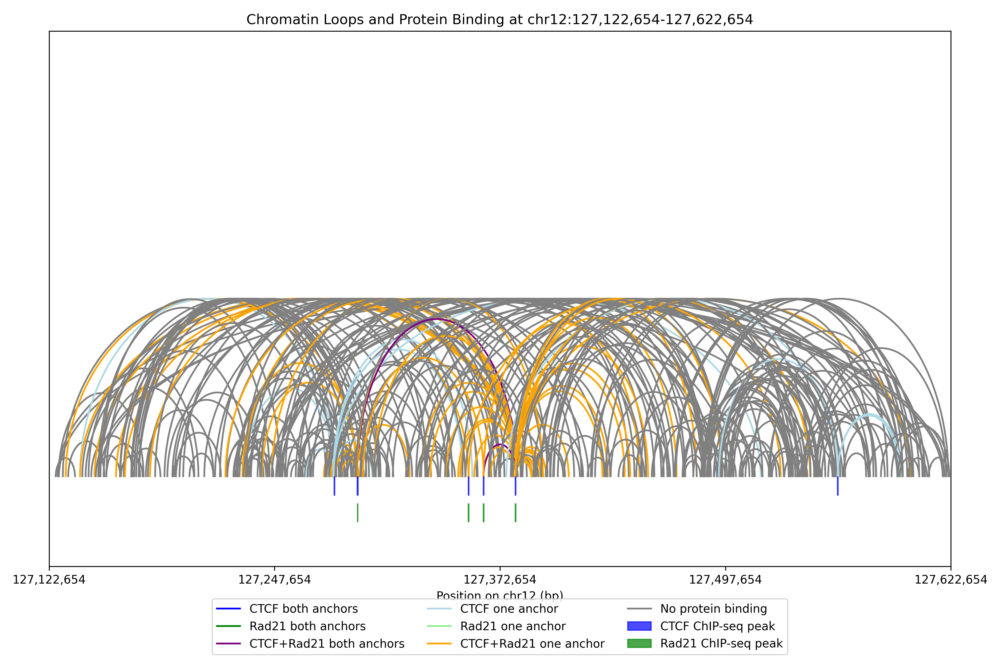

Visualizing region with co-binding: chr17:28506923-29006923
Visualizing 1569 loops in chr17:28506923-29006923


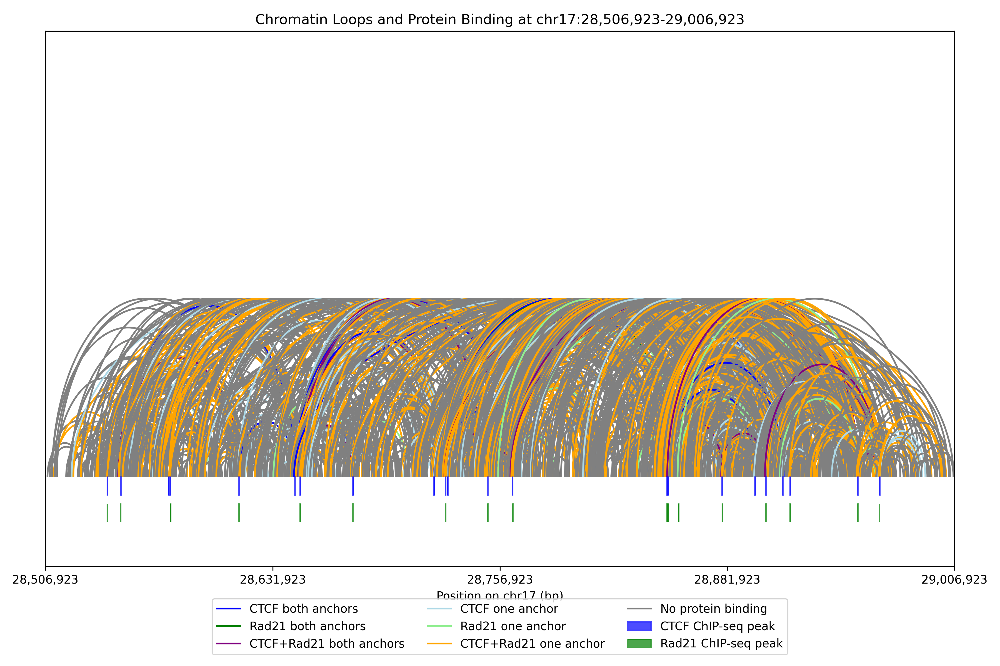


All results saved to results directory


In [14]:
# Step 7: Visualize an example genomic region
print("\nStep 7: Visualizing example genomic regions...")

n = 5

# Find a region with shared binding of both proteins
if len(common_both_anchors) > 0:
    for i in range(n):
        # Set random seed in pandas
        np.random.seed(i)
        
        # Choose a loop with both CTCF and Rad21 in both anchors
        example_loop = common_both_anchors.sample(1).iloc[0]
        
        # Define region around the loop
        region_size = max(500000, int(example_loop["end2"] - example_loop["start1"] + 200000))
        region_mid = (example_loop["start1"] + example_loop["end2"]) // 2
        
        region = {
            "chrom": example_loop["chrom1"],
            "start": max(0, region_mid - region_size//2),
            "end": region_mid + region_size//2
        }
        
        print(f"Visualizing region with co-binding: {region['chrom']}:{region['start']}-{region['end']}")
        visualize_genomic_region(chia_pet, ctcf_chip, rad21_chip, region, output_dir)
        display(Image(f"{output_dir}/genomic_region_{region['chrom']}_{region['start']}-{region['end']}.png"))
else:
    print("No loops with both CTCF and Rad21 in both anchors found. Using random region.")
    visualize_genomic_region(chia_pet, ctcf_chip, rad21_chip, None, output_dir)

print(f"\nAll results saved to {output_dir} directory")